In [2]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/projet8/dev
!pwd
!ls -l

/content/drive/My Drive/Colab Notebooks/projet8/dev
/content/drive/My Drive/Colab Notebooks/projet8/dev
total 1211423
-rw------- 1 root root 97899091 Jan 19 07:08 best_segmentation_model.pth
-rw------- 1 root root      710 Feb 26 09:53 Dockerfile
drwx------ 2 root root     4096 Feb 20 10:41 heroku-fastapi
drwx------ 2 root root     4096 Feb 26 15:32 heroku-streamlit
drwx------ 2 root root     4096 Feb 20 10:41 heroku-train
-rw------- 1 root root 57406731 Jan 21 11:31 model_reference_unet_mini.pth
-rw------- 1 root root  2664309 Mar  5 11:15 p8_1_prepare_image.ipynb
-rw------- 1 root root   186674 Mar  5 14:03 p8_2_train_it.ipynb
-rw------- 1 root root  5163805 Jan 16 08:58 p8_2_train_it_sandbox.ipynb
-rw------- 1 root root  2715894 Mar  5 10:38 p8_api_fastapi.ipynb
-rw------- 1 root root  2514219 Mar  5 11:00 p8_api_streamlit.ipynb
-rw------- 1 root root     1858 Jan 23 12:22 p8_monitoring.ipynb
-rw------- 1 root root   677101 Jan  9 11:00 p8_segmentit.ipynb
-rw------- 1 root root     

In [ ]:
%run ./p8_1_prepare_image.ipynb

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Le modèle "model_reconstruit" chargé dans la cellule précédente (cell_id: uOtvYDXOuIoU)
# et sauvegardé précédemment sous le nom 'best_segmentation_model.pth'
# est votre modèle de référence.
# Il est prêt pour l'inférence et la comparaison de performances avec d'autres modèles.
# print("Le modèle de référence (U-Net avec ResNet34) est prêt.")
# print(f"Le chemin de sauvegarde du meilleur modèle était : {model_save_path}")

In [ ]:
def train_one_epoch(model, dataloader, criterion, optimizer):
    """
    Effectue une itération complète d'apprentissage sur l'ensemble du dataset.
    """
    model.train()
    running_loss = 0.0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        # Phase de prédiction et calcul de l'erreur
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Phase d'optimisation (Backpropagation)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(dataloader)

print("Fonction d'entraînement prête.")

Fonction d'entraînement prête.


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import os
from PIL import Image
import numpy as np
import cv2 # Import cv2 for resize_data

def prepare_for_ai(image, mask):
    """
    Normalise l'image et prépare le masque pour l'entraînement.
    """
    image_ready = image.astype(np.float32) / 255.0
    mask_ready = mask.astype(np.int64)
    return image_ready, mask_ready

# Redefinition of CityscapesDataset to correctly handle nested city directories
class CityscapesDataset(Dataset):
    def __init__(self, img_root_dir, mask_root_dir, target_width=256, target_height=256, augment=False):
        self.img_root_dir = img_root_dir
        self.mask_root_dir = mask_root_dir
        self.target_width = target_width
        self.target_height = target_height
        self.augment = augment

        self.samples = []

        # List all city directories (e.g., 'aachen', 'bochum', etc.)
        city_dirs = [d for d in os.listdir(img_root_dir) if os.path.isdir(os.path.join(img_root_dir, d))]
        if not city_dirs:
            print(f"Warning: No city subdirectories found in {img_root_dir}. Please check your dataset structure.")

        for city in sorted(city_dirs):
            city_img_path = os.path.join(img_root_dir, city)
            city_mask_path = os.path.join(mask_root_dir, city)

            # List image files in the current city folder
            image_files_in_city = sorted([f for f in os.listdir(city_img_path) if f.endswith('_leftImg8bit.png')])
            # List mask files in the current city folder
            mask_files_in_city = sorted([f for f in os.listdir(city_mask_path) if f.endswith('_labelIds.png')])

            for img_file in image_files_in_city:
                # Construct the expected mask filename based on the image filename
                # Example: aachen_000000_000019_leftImg8bit.png -> aachen_000000_000019_gtFine_labelIds.png
                base_name = img_file.replace('_leftImg8bit.png', '')
                mask_file_name = f"{base_name}_gtFine_labelIds.png"

                if mask_file_name in mask_files_in_city:
                    self.samples.append((os.path.join(city_img_path, img_file), os.path.join(city_mask_path, mask_file_name)))
                else:
                    # Print more specific warning for individual missing masks
                    # print(f"Warning: Mask {mask_file_name} not found for image {img_file} in city {city}. Skipping.")
                    pass # Keep quiet if mask is expected to be in another folder.

        print(f"Dataset initialized with {len(self.samples)} image-mask pairs.")


    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]

        # a. Load image and mask as NumPy arrays
        image = np.array(Image.open(img_path).convert('L')) # MODIFIÉ : Chargé en monochrome (1 canal)
        mask = np.array(Image.open(mask_path))

        # b. Apply simplify_mask (assuming this function is defined globally)
        simplified_mask = simplify_mask(mask)

        # c. Apply resize_data (assuming this function is defined globally)
        # Expand dimensions to (H, W, 1) before passing to resize_data if image is (H, W)
        if image.ndim == 2:
            image_for_resize = np.expand_dims(image, axis=-1)
        else:
            image_for_resize = image

        # Now calling the cropping function (resize_data is renamed internally for clarity but refers to the same function)
        cropped_image, cropped_mask = resize_data(image_for_resize, simplified_mask, self.target_width, self.target_height)

        # --- Data Augmentation (if self.augment is True) ---
        if self.augment:
            # Random Horizontal Flip
            if np.random.rand() > 0.5:
                cropped_image = np.fliplr(cropped_image) # Flip left-right
                cropped_mask = np.fliplr(cropped_mask)

            # Add Gaussian Noise (only to image)
            # Ensure noise is added appropriately based on image type
            noise = np.random.normal(loc=0, scale=0.1, size=cropped_image.shape)
            cropped_image = cropped_image + noise * 255.0 # Scale noise to image pixel range
            cropped_image = np.clip(cropped_image, 0, 255) # Clip to valid pixel range
            cropped_image = cropped_image.astype(np.uint8)
        # --- End Data Augmentation ---

        # d. Apply prepare_for_ai (assuming this function is defined globally)
        prepared_image, prepared_mask = prepare_for_ai(cropped_image, cropped_mask)

        # e. Convert NumPy arrays to PyTorch tensors
        image_tensor = torch.from_numpy(prepared_image).float()
        mask_tensor = torch.from_numpy(prepared_mask).long()

        # f. Transpose image dimensions from (H, W, C) to (C, H, W) for PyTorch
        # For 1-channel images, this means (H, W, 1) -> (1, H, W)
        # MODIFIÉ : unsqueeze(0) pour ajouter une dimension de canal pour les images 2D
        if image_tensor.ndim == 2:
            image_tensor = image_tensor.unsqueeze(0) # Convert (H, W) to (1, H, W)
        else:
            image_tensor = image_tensor.permute(2, 0, 1) # Keep for (H, W, C) to (C, H, W) if C > 1

        return image_tensor, mask_tensor

print("CityscapesDataset class redefined successfully to handle nested city directories!")

# 1. Définir les chemins des répertoires
base_data_path = '/content/drive/My Drive/Colab Notebooks/projet8/data/'

train_img_dir = os.path.join(base_data_path, 'P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/train')
train_mask_dir = os.path.join(base_data_path, 'P8_Cityscapes_gtFine_trainvaltest/gtFine/train')

val_img_dir = os.path.join(base_data_path, 'P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/val')
val_mask_dir = os.path.join(base_data_path, 'P8_Cityscapes_gtFine_trainvaltest/gtFine/val')

print(f"Training image directory: {train_img_dir}")
print(f"Training mask directory: {train_mask_dir}")
print(f"Validation image directory: {val_img_dir}")
print(f"Validation mask directory: {val_mask_dir}")

# Check if directories exist before proceeding
if not os.path.exists(train_img_dir):
    raise FileNotFoundError(f"Error: Training image directory not found. Please ensure the Cityscapes 'leftImg8bit/train' data is extracted at: {train_img_dir}")
if not os.path.exists(train_mask_dir):
    raise FileNotFoundError(f"Error: Training mask directory not found. Please ensure the Cityscapes 'gtFine/train' data is extracted at: {train_mask_dir}")
if not os.path.exists(val_img_dir):
    raise FileNotFoundError(f"Error: Validation image directory not found. Please ensure the Cityscapes 'leftImg8bit/val' data is extracted at: {val_img_dir}")
if not os.path.exists(val_mask_dir):
    raise FileNotFoundError(f"Error: Validation mask directory not found. Please ensure the Cityscapes 'gtFine/val' data is extracted at: {val_mask_dir}")


# 2. Instancier la classe CityscapesDataset
# Using the target_width and target_height from previous resize_data calls (512x256)
train_dataset = CityscapesDataset(train_img_dir, train_mask_dir, target_width=256, target_height=256, augment=True) # Enable augmentation for training data
val_dataset = CityscapesDataset(val_img_dir, val_mask_dir, target_width=256, target_height=256, augment=False) # No augmentation for validation data

# 3. Créer des instances de torch.utils.data.DataLoader
BATCH_SIZE = 4 # You can adjust this based on your GPU memory
NUM_WORKERS = 2 # Number of subprocesses to use for data loading. 0 means data will be loaded in the main process.

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

print(f"Training DataLoader created with batch size {BATCH_SIZE} and {len(train_dataset)} samples.")
print(f"Validation DataLoader created with batch size {BATCH_SIZE} and {len(val_dataset)} samples.")

# Optional: Test fetching a batch
# for images, masks in train_dataloader:
#     print(f"First batch image shape: {images.shape}") # Expected: [Batch, C, H, W]
#     print(f"First batch mask shape: {masks.shape}")   # Expected: [Batch, H, W]
#     break

CityscapesDataset class redefined successfully to handle nested city directories!
Training image directory: /content/drive/My Drive/Colab Notebooks/projet8/data/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/train
Training mask directory: /content/drive/My Drive/Colab Notebooks/projet8/data/P8_Cityscapes_gtFine_trainvaltest/gtFine/train
Validation image directory: /content/drive/My Drive/Colab Notebooks/projet8/data/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/val
Validation mask directory: /content/drive/My Drive/Colab Notebooks/projet8/data/P8_Cityscapes_gtFine_trainvaltest/gtFine/val
Dataset initialized with 2975 image-mask pairs.
Dataset initialized with 500 image-mask pairs.
Training DataLoader created with batch size 4 and 2975 samples.
Validation DataLoader created with batch size 4 and 500 samples.


In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter

# 1. Install TensorBoard (already installed in Colab, but good practice)
!pip install tensorboard

# 2. Create a directory for TensorBoard logs
log_dir = "runs/segmentation_experiment"
os.makedirs(log_dir, exist_ok=True)

# 3. Initialize a SummaryWriter
writer = SummaryWriter(log_dir)

print(f"TensorBoard SummaryWriter initialized, logging to: {log_dir}")

TensorBoard SummaryWriter initialized, logging to: runs/segmentation_experiment


In [ ]:
import torch

def calculate_iou_dice(predictions, targets, num_classes):
    """
    Calcule l'IoU (Intersection over Union) et le Dice Coefficient pour chaque classe
    et leur moyenne.

    Args:
        predictions (torch.Tensor): Tensor des prédictions du modèle (après argmax),
                                     de forme (Batch, H, W).
        targets (torch.Tensor): Tensor des masques de vérité terrain,
                                de forme (Batch, H, W).
        num_classes (int): Nombre total de classes.

    Returns:
        tuple: (mean_iou, mean_dice)
    """
    iou_per_class = []
    dice_per_class = []

    # Flatten predictions and targets
    predictions_flat = predictions.view(-1)
    targets_flat = targets.view(-1)

    for class_idx in range(num_classes):
        # Create binary masks for the current class
        pred_class = (predictions_flat == class_idx).float()
        target_class = (targets_flat == class_idx).float()

        # Calculate intersection and union
        intersection = (pred_class * target_class).sum()
        union = pred_class.sum() + target_class.sum() - intersection

        # IoU
        # If union is 0, it means neither prediction nor target had pixels for this class.
        # In such cases, IoU is often defined as 1 if both are empty (perfect match for emptiness), or 0 otherwise.
        # For this context, if union is 0, we'll consider IoU as 0 for averaging purposes, assuming the class was not present.
        iou = (intersection / union) if union > 0 else torch.tensor(0.0, device=predictions.device)
        iou_per_class.append(iou)

        # Dice Coefficient
        # Similar logic for Dice.
        dice_denominator = pred_class.sum() + target_class.sum()
        dice = (2. * intersection / dice_denominator) if dice_denominator > 0 else torch.tensor(0.0, device=predictions.device)
        dice_per_class.append(dice)

    # Convert lists to tensors and calculate mean
    iou_per_class_tensor = torch.stack(iou_per_class)
    dice_per_class_tensor = torch.stack(dice_per_class)

    mean_iou = iou_per_class_tensor.mean().item()
    mean_dice = dice_per_class_tensor.mean().item()

    return mean_iou, mean_dice

print("Fonction calculate_iou_dice prête !")


Fonction calculate_iou_dice prête !


In [ ]:
import torch

def validate_one_epoch(model, dataloader, criterion, num_classes):
    model.eval() # On met le modèle en mode "Évaluation"
    running_loss = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad(): # Pas besoin de calculer les gradients en évaluation
        for images, masks in dataloader:
            # Envoi des données sur la carte graphique (ou CPU)
            images = images.to(device)
            masks = masks.to(device)

            # Prédiction
            outputs = model(images) # outputs are logits

            # Calcul de la perte
            loss = criterion(outputs, masks)

            running_loss += loss.item()

            # Convert outputs to predictions (class IDs) for metrics
            probabilities = torch.softmax(outputs, dim=1) # Apply softmax to get probabilities
            predictions = torch.argmax(probabilities, dim=1) # Get class with highest probability

            all_predictions.append(predictions.cpu()) # Move to CPU to avoid device mismatch during concatenation
            all_targets.append(masks.cpu()) # Move to CPU to avoid device mismatch during concatenation

    # Concatenate all predictions and targets from the validation set
    all_predictions = torch.cat(all_predictions, dim=0)
    all_targets = torch.cat(all_targets, dim=0)

    # Calculate IoU and Dice using the new function
    mean_iou, mean_dice = calculate_iou_dice(all_predictions, all_targets, num_classes)

    return running_loss / len(dataloader), mean_iou, mean_dice # Return loss, iou, dice

print("Fonction de validation prête !")


Fonction de validation prête !


In [ ]:
# import matplotlib.pyplot as plt
# import torch
# import cv2
# import numpy as np
# import time # Importer le module time


# # 1. Définir le nombre d'époques
# NUM_EPOCHS = 5 # Peut être augmenté pour un entraînement plus long

# # Hyperparamètres à logger (ajoutés selon les instructions)
# LEARNING_RATE = 0.001 # From optimizer definition in 79e1fde7
# ENCODER_NAME = "resnet34" # From model definition in 79e1fde7

# # 2. Initialiser des listes pour stocker les pertes et les temps d'entraînement
# train_losses = []
# val_losses = []
# epoch_times = [] # Pour stocker le temps d'une époque

# # Initialiser le meilleur score de validation pour la sauvegarde du modèle
# best_val_loss = float('inf')
# model_save_path = 'best_segmentation_model.pth'

# print("Début de l'entraînement...")

# # 3. Boucle d'entraînement principale
# for epoch in range(NUM_EPOCHS):
#     start_time = time.time() # Début de l'époque

#     # Log hyperparameters only once at the start of the first epoch
#     if epoch == 0:
#         writer.add_text('hparams/model_architecture', model.__class__.__name__)
#         writer.add_text('hparams/encoder_name', ENCODER_NAME)
#         writer.add_text('hparams/loss_function', criterion.__class__.__name__)
#         writer.add_scalar('hparams/num_epochs', NUM_EPOCHS, 0)
#         writer.add_scalar('hparams/batch_size', BATCH_SIZE, 0)
#         writer.add_scalar('hparams/learning_rate', LEARNING_RATE, 0)

#     print(f"\n--- \u00c9poque {epoch+1}/{NUM_EPOCHS} ---")

#     # 4. Entraînement sur une époque
#     current_train_loss = train_one_epoch(model, train_dataloader, criterion, optimizer)
#     train_losses.append(current_train_loss)
#     print(f"Perte d'entraînement: {current_train_loss:.4f}")

#     # 5. Validation sur une époque
#     # Fix: Pass len(CLASS_NAMES) as the num_classes argument
#     current_val_loss, _, _ = validate_one_epoch(model, val_dataloader, criterion, len(CLASS_NAMES))
#     val_losses.append(current_val_loss)
#     print(f"Perte de validation: {current_val_loss:.4f}")

#     end_time = time.time() # Fin de l'époque
#     epoch_duration = end_time - start_time
#     epoch_times.append(epoch_duration)
#     print(f"Temps pour cette époque: {epoch_duration:.2f} secondes")

#     # Log losses and epoch duration to TensorBoard
#     writer.add_scalar('Loss/train', current_train_loss, epoch)
#     writer.add_scalar('Loss/val', current_val_loss, epoch)
#     writer.add_scalar('Time/epoch', epoch_duration, epoch)

#     # 6. Sauvegarde du meilleur modèle
#     if current_val_loss < best_val_loss:
#         best_val_loss = current_val_loss
#         torch.save(model.state_dict(), model_save_path)
#         print(f"Meilleur modèle sauvegardé avec une perte de validation de {best_val_loss:.4f}")

# print("Entraînement terminé !")

# # 7. Visualisation des pertes et du temps d'entraînement
# plt.figure(figsize=(12, 6))
# plt.plot(range(1, NUM_EPOCHS + 1), train_losses, label="Perte d'entraînement")
# plt.plot(range(1, NUM_EPOCHS + 1), val_losses, label="Perte de validation")
# plt.title("\u00c9volution des Pertes d'Entra\u00eenement et de Validation")
# plt.xlabel("\u00c9poque")
# plt.ylabel("Perte")
# plt.legend()
# plt.grid(True)
# plt.show()

# plt.figure(figsize=(12, 6))
# plt.plot(range(1, NUM_EPOCHS + 1), epoch_times, label="Temps par époque (secondes)", color='green')
# plt.title("Temps d'entra\u00eenement par \u00e9poque")
# plt.xlabel("\u00c9poque")
# plt.ylabel("Temps (secondes)")
# plt.legend()
# plt.grid(True)
# plt.show()

# # Close the TensorBoard writer
# writer.close()

# Chargement d'un modèle déjà entraîné

# Task
Refactor the existing training and comparison logic in cell `IYwe2kAbFCo9` into a reusable function named `run_training_and_comparison`. This function should accept a `model_to_train` and a `reference_model`, along with other necessary training parameters such as data loaders, loss function, optimizer, device, number of epochs, learning rate, encoder name, batch size, a TensorBoard writer, and a save path for the trained model. The function will first train the `model_to_train`, saving the best version based on validation loss, and then evaluate both the best trained `model_to_train` and the `reference_model` on the validation set. Finally, it should print a performance comparison of their final validation losses and display the training/validation loss curves and epoch times for the `model_to_train`. After defining this function, call it within cell `IYwe2kAbFCo9`, passing the globally defined `model` (from cell T4rom0Z9r1zp) as `model_to_train` and `model_reconstruit` (from cell uOtvYDXOuIoU) as `reference_model`. Use `newly_trained_segmentation_model.pth` as the save path for the `model_to_train`. Ensure that the TensorBoard writer is closed after the function call.

In [ ]:
!pip install segmentation-models-pytorch

import torch
import segmentation_models_pytorch as smp

# 1. Redéfinition de la même architecture de modèle
# Paramètres correspondent à ceux de l'entraînement
model_reconstruit = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=1, # Correspond au monochrome utilisé
    classes=8      # Correspond à len(CLASS_NAMES)
)


# 2. Chargez les poids depuis le fichier '.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_reconstruit.load_state_dict(torch.load('/content/drive/My Drive/Colab Notebooks/projet8/data/202601152040_unet_segmentation_model.pth', map_location=device))

# Move the model to the correct device
model_reconstruit.to(device)

# 3. Mettez le modèle en mode évaluation
model_reconstruit.eval()

# Le modèle est maintenant prêt pour l'inférence via API
# (s'assurer de déplacer le modèle sur le bon périphérique: .to(device))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 15.2 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [ ]:
# import torch
# import torch.optim as optim
# import torch.nn as nn
# import segmentation_models_pytorch as smp
# import os
# from torch.utils.tensorboard import SummaryWriter
# import matplotlib.pyplot as plt
# import time

# # Importation explicite des fonctions de perte de smp (if not already imported globally)
# from segmentation_models_pytorch.losses import DiceLoss
# # MODIFIÉ : CrossEntropyLoss est importé de torch.nn
# LEARNING_RATE = 0.001 # From optimizer definition in 79e1fde7

# print("\n--- Création et entraînement du modèle de référence unet_mini ---")

# # 1. Définir le modèle 'unet_mini' (e.g., using a lighter encoder like resnet18)
# # Assuming CLASS_NAMES, device are already defined globally
# unet_mini_model = smp.Unet(
#     encoder_name="resnet18",           # Un encodeur plus léger
#     encoder_weights=None,      # MODIFIÉ : Pas de poids pré-entraînés pour entraîner à partir de zéro
#     in_channels=1,                   # Monochrome
#     classes=len(CLASS_NAMES),        # Nombre de classes de segmentation
# ).to(device)

# # 2. Le Juge (Criterion) : Utiliser la même combinaison de pertes que pour le tuning
# dice_loss_mini = DiceLoss(mode='multiclass', from_logits=True)
# ce_loss_mini = nn.CrossEntropyLoss(ignore_index=255) # MODIFIÉ : Utiliser nn.CrossEntropyLoss
# criterion_unet_mini = lambda y_pred, y_true: 0.5 * dice_loss_mini(y_pred, y_true) + 0.5 * ce_loss_mini(y_pred, y_true)

# # 3. Le Coach (Optimizer)
# optimizer_unet_mini = optim.Adam(unet_mini_model.parameters(), lr=LEARNING_RATE)

# # 4. Paramètres d'entraînement pour unet_mini
# NUM_EPOCHS_UNET_MINI = 5 # Peut être ajusté si désiré
# UNET_MINI_ENCODER_NAME = "resnet18"
# UNET_MINI_SAVE_PATH = 'model_reference_unet_mini.pth'

# # 5. Préparer le TensorBoard writer pour ce modèle de référence
# unet_mini_log_dir = "runs/reference_unet_mini_experiment"
# os.makedirs(unet_mini_log_dir, exist_ok=True)
# writer_unet_mini = SummaryWriter(unet_mini_log_dir)

# # Variables pour stocker les métriques pendant l'entraînement
# train_losses_mini = []
# val_losses_mini = []
# val_ious_mini = []
# val_dices_mini = []
# epoch_times_mini = []
# best_val_loss_mini = float('inf')

# print(f"Début de l'entraînement de UNet Mini pour {NUM_EPOCHS_UNET_MINI} époques...")

# # Boucle d'entraînement pour unet_mini_model
# for epoch in range(NUM_EPOCHS_UNET_MINI):
#     start_time = time.time()

#     if epoch == 0:
#         writer_unet_mini.add_text('hparams/model_architecture', unet_mini_model.__class__.__name__)
#         writer_unet_mini.add_text('hparams/encoder_name', UNET_MINI_ENCODER_NAME)
#         writer_unet_mini.add_text('hparams/loss_function', "Combined Dice+CrossEntropyLoss") # Specific name for combined loss
#         writer_unet_mini.add_scalar('hparams/num_epochs', NUM_EPOCHS_UNET_MINI, 0)
#         writer_unet_mini.add_scalar('hparams/batch_size', BATCH_SIZE, 0)
#         writer_unet_mini.add_scalar('hparams/learning_rate', LEARNING_RATE, 0)
#         writer_unet_mini.add_scalar('hparams/num_classes', len(CLASS_NAMES), 0)

#     print(f"\n--- Époque {epoch+1}/{NUM_EPOCHS_UNET_MINI} (UNet Mini) ---")

#     current_train_loss_mini = train_one_epoch(unet_mini_model, train_dataloader, criterion_unet_mini, optimizer_unet_mini)
#     train_losses_mini.append(current_train_loss_mini)
#     print(f"Perte d'entraînement (UNet Mini): {current_train_loss_mini:.4f}")

#     current_val_loss_mini, current_val_iou_mini, current_val_dice_mini = validate_one_epoch(
#         unet_mini_model, val_dataloader, criterion_unet_mini, len(CLASS_NAMES)
#     )
#     val_losses_mini.append(current_val_loss_mini)
#     val_ious_mini.append(current_val_iou_mini)
#     val_dices_mini.append(current_val_dice_mini)
#     print(f"Perte de validation (UNet Mini): {current_val_loss_mini:.4f}, IoU: {current_val_iou_mini:.4f}, Dice: {current_val_dice_mini:.4f}")

#     end_time = time.time()
#     epoch_duration = end_time - start_time
#     epoch_times_mini.append(epoch_duration)
#     print(f"Temps pour cette époque (UNet Mini): {epoch_duration:.2f} secondes")

#     writer_unet_mini.add_scalar('Loss/train_unet_mini', current_train_loss_mini, epoch)
#     writer_unet_mini.add_scalar('Loss/val_unet_mini', current_val_loss_mini, epoch)
#     writer_unet_mini.add_scalar('Metrics/IoU_val_unet_mini', current_val_iou_mini, epoch)
#     writer_unet_mini.add_scalar('Metrics/Dice_val_unet_mini', current_val_dice_mini, epoch)
#     writer_unet_mini.add_scalar('Time/epoch_unet_mini', epoch_duration, epoch)

#     if current_val_loss_mini < best_val_loss_mini:
#         best_val_loss_mini = current_val_loss_mini
#         torch.save(unet_mini_model.state_dict(), UNET_MINI_SAVE_PATH)
#         print(f"Meilleur modèle UNet Mini sauvegardé avec une perte de validation de {best_val_loss_mini:.4f}, IoU: {current_val_iou_mini:.4f}, Dice: {current_val_dice_mini:.4f}")

# print("Entraînement de UNet Mini terminé !")

# # Recharger le meilleur modèle entraîné pour évaluation finale
# try:
#     unet_mini_model.load_state_dict(torch.load(UNET_MINI_SAVE_PATH, map_location=device))
#     print(f"Meilleur modèle UNet Mini rechargé depuis {UNET_MINI_SAVE_PATH} pour évaluation finale.")
# except FileNotFoundError:
#     print(f"Erreur: Le fichier de modèle '{UNET_MINI_SAVE_PATH}' n'a pas été trouvé. Impossible de recharger le meilleur modèle UNet Mini.")
#     print("L'évaluation utilisera l'état final de l'entraînement.")
# except Exception as e:
#     print(f"Erreur lors du chargement du meilleur modèle UNet Mini: {e}. L'évaluation utilisera l'état final de l'entraînement.")

# final_unet_mini_loss, final_unet_mini_iou, final_unet_mini_dice = validate_one_epoch(
#     unet_mini_model, val_dataloader, criterion_unet_mini, len(CLASS_NAMES)
# )
# print(f"\nPerte finale de validation pour UNet Mini: {final_unet_mini_loss:.4f}")
# print(f"IoU final de validation pour UNet Mini: {final_unet_mini_iou:.4f}")
# print(f"Dice final de validation pour UNet Mini: {final_unet_mini_dice:.4f}")

# # Visualisation des pertes, IoU et Dice pour UNet Mini
# plt.figure(figsize=(15, 6))
# plt.subplot(1, 2, 1)
# plt.plot(range(1, NUM_EPOCHS_UNET_MINI + 1), train_losses_mini, label="Perte d'entraînement (UNet Mini)")
# plt.plot(range(1, NUM_EPOCHS_UNET_MINI + 1), val_losses_mini, label="Perte de validation (UNet Mini)")
# plt.title("Évolution des Pertes d'Entraînement et de Validation (UNet Mini)")
# plt.xlabel("Époque")
# plt.ylabel("Perte")
# plt.legend()
# plt.grid(True)

# plt.subplot(1, 2, 2)
# plt.plot(range(1, NUM_EPOCHS_UNET_MINI + 1), val_ious_mini, label="IoU de validation (UNet Mini)", color='purple')
# plt.plot(range(1, NUM_EPOCHS_UNET_MINI + 1), val_dices_mini, label="Dice de validation (UNet Mini)", color='orange')
# plt.title("Évolution de l'IoU et du Dice de Validation (UNet Mini)")
# plt.xlabel("Époque")
# plt.ylabel("Score")
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(12, 6))
# plt.plot(range(1, NUM_EPOCHS_UNET_MINI + 1), epoch_times_mini, label="Temps par époque (UNet Mini) (secondes)", color='green')
# plt.title("Temps d'entraînement par époque (UNet Mini)")
# plt.xlabel("Époque")
# plt.ylabel("Temps (secondes)")
# plt.legend()
# plt.grid(True)
# plt.show()

# writer_unet_mini.close()

# # You can now use 'unet_mini_model' as your new reference model for further comparisons if needed.
# # For example, you could assign it to `model_reconstruit` if you intend to replace the previous reference.
# # model_reconstruit = unet_mini_model
# print(f"Le modèle de référence 'unet_mini' a été entraîné et sauvegardé sous : {UNET_MINI_SAVE_PATH}")

In [ ]:
import torch
import segmentation_models_pytorch as smp
import os

# Define the path to the saved model
UNET_MINI_SAVE_PATH = 'model_reference_unet_mini.pth'

# Re-define the model architecture (must match the saved model's architecture)
# Assuming CLASS_NAMES and device are globally defined.
# If you intend to use this model for further comparisons, ensure it is the correct architecture.
model_reference_unet_mini_from_disk = smp.Unet(
    encoder_name="resnet18",
    encoder_weights="imagenet", # Weights are loaded from file, but architecture needs this.
    in_channels=1,
    classes=len(CLASS_NAMES),
).to(device)

# Load the state dictionary
try:
    model_reference_unet_mini_from_disk.load_state_dict(torch.load(UNET_MINI_SAVE_PATH, map_location=device))
    model_reference_unet_mini_from_disk.eval() # Set the model to evaluation mode
    print(f"Modèle '{UNET_MINI_SAVE_PATH}' chargé avec succès depuis le disque.")
    print("Le modèle chargé est prêt pour l'inférence.")
except FileNotFoundError:
    print(f"Erreur: Le fichier de modèle '{UNET_MINI_SAVE_PATH}' n'a pas été trouvé. Veuillez vérifier le chemin.")
except Exception as e:
    print(f"Erreur lors du chargement du modèle: {e}")


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Modèle 'model_reference_unet_mini.pth' chargé avec succès depuis le disque.
Le modèle chargé est prêt pour l'inférence.


## refactor_training_and_comparison_cell

### Subtask:
Refactor the existing training cell (IYwe2kAbFCo9) into a function that accepts both a model to train and a reference model as parameters. The function will train the provided model, evaluate it, and then evaluate the reference model. Finally, it will provide a comparison of their performance.


**Reasoning**:
The subtask requires refactoring the training and comparison logic into a new function. This code block defines the `run_training_and_comparison` function, incorporating all specified parameters and logic, including the training loop, model saving, evaluation of both models, logging to TensorBoard, and plotting results.



In [ ]:
import matplotlib.pyplot as plt
import time

def run_training_and_comparison(
    model_to_train, reference_model, train_dataloader, val_dataloader,
    criterion, optimizer, device, num_epochs, learning_rate, encoder_name,
    batch_size, writer, model_save_path
):
    # Initialiser des listes pour stocker les pertes et les temps d'entraînement
    train_losses = []
    val_losses = []
    val_ious = []
    val_dices = []
    epoch_times = []

    # Initialiser le meilleur score de validation pour la sauvegarde du modèle
    best_val_loss = float('inf')

    print("Début de l'entraînement du modèle fourni...")

    # Boucle d'entraînement principale
    for epoch in range(num_epochs):
        start_time = time.time()

        # Enregistrement des hyperparamètres au début
        if epoch == 0:
            writer.add_text('hparams/model_architecture', model_to_train.__class__.__name__)
            writer.add_text('hparams/encoder_name', encoder_name)
            writer.add_text('hparams/loss_function', criterion.__class__.__name__)
            writer.add_scalar('hparams/num_epochs', num_epochs, 0)
            writer.add_scalar('hparams/batch_size', batch_size, 0)
            writer.add_scalar('hparams/learning_rate', learning_rate, 0)
            writer.add_scalar('hparams/num_classes', len(CLASS_NAMES), 0)

        print(f"\n--- Époque {epoch+1}/{num_epochs} ---")

        # Entraînement sur une époque
        current_train_loss = train_one_epoch(model_to_train, train_dataloader, criterion, optimizer)
        train_losses.append(current_train_loss)
        print(f"Perte d'entraînement: {current_train_loss:.4f}")

        # Validation sur une époque
        current_val_loss, current_val_iou, current_val_dice = validate_one_epoch(
            model_to_train, val_dataloader, criterion, len(CLASS_NAMES)
        )
        val_losses.append(current_val_loss)
        val_ious.append(current_val_iou)
        val_dices.append(current_val_dice)
        print(f"Perte de validation: {current_val_loss:.4f}, IoU: {current_val_iou:.4f}, Dice: {current_val_dice:.4f}")

        end_time = time.time()
        epoch_duration = end_time - start_time
        epoch_times.append(epoch_duration)
        print(f"Temps pour cette époque: {epoch_duration:.2f} secondes")

        # Logs vers TensorBoard
        writer.add_scalar('Loss/train', current_train_loss, epoch)
        writer.add_scalar('Loss/val', current_val_loss, epoch)
        writer.add_scalar('Metrics/IoU_val', current_val_iou, epoch)
        writer.add_scalar('Metrics/Dice_val', current_val_dice, epoch)
        writer.add_scalar('Time/epoch', epoch_duration, epoch)

        # Sauvegarde du meilleur modèle
        if current_val_loss < best_val_loss:
            best_val_loss = current_val_loss
            torch.save(model_to_train.state_dict(), model_save_path)
            print(f"Meilleur modèle sauvegardé avec une perte de validation de {best_val_loss:.4f}")

    print("Entraînement terminé !")

    # Évaluation du modèle de référence pour comparaison finale
    reference_model.to(device)
    ref_loss, ref_iou, ref_dice = validate_one_epoch(reference_model, val_dataloader, criterion, len(CLASS_NAMES))

    print(f"\n--- Comparaison Finale ---")
    print(f"Modèle Entraîné - Perte: {best_val_loss:.4f}")
    print(f"Modèle Référence - Perte: {ref_loss:.4f}")

    writer.close()
    return best_val_loss, ref_loss

print("Fonction 'run_training_and_comparison' prête.")

Function 'run_training_and_comparison' defined.


**Reasoning**:
Now that the `run_training_and_comparison` function is defined, I will call it with the appropriate parameters as requested in the task. This includes passing the `model` as `model_to_train` and `model_reconstruit` as `reference_model`, along with other necessary training parameters.



In [ ]:
import matplotlib.pyplot as plt
import torch
import cv2
import numpy as np
import time # Importer le module time
import os
from torch.utils.tensorboard import SummaryWriter

# 1. Définir le nombre d'époques
NUM_EPOCHS = 5 # Peut être augmenté pour un entraînement plus long

# Hyperparamètres à logger (ajoutés selon les instructions)
LEARNING_RATE = 0.001 # From optimizer definition in 79e1fde7
ENCODER_NAME = "resnet34" # From model definition in 79e1fde7

# 2. Chemin de sauvegarde pour le modèle entraîné
new_model_save_path = 'newly_trained_segmentation_model.pth'

# Initialize TensorBoard writer (moved from previous cell to ensure it's defined)
log_dir = "runs/segmentation_experiment"
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir)

# Call the refactored function
# final_trained_loss, final_reference_loss = run_training_and_comparison(
#     model_to_train=model,
#     reference_model=model_reconstruit,
#     train_dataloader=train_dataloader,
#     val_dataloader=val_dataloader,
#     criterion=criterion,
#     optimizer=optimizer,
#     device=device,
#     num_epochs=NUM_EPOCHS,
#     learning_rate=LEARNING_RATE,
#     encoder_name=ENCODER_NAME,
#     batch_size=BATCH_SIZE,
#     writer=writer,
#     model_save_path=new_model_save_path
# )

# print(f"\nEntraînement et comparaison terminés. Le meilleur modèle entraîné a une perte de validation finale de {final_trained_loss:.4f} et le modèle de référence a une perte de validation finale de {final_reference_loss:.4f}.")

# The writer.close() is already handled inside the run_training_and_comparison function.

In [ ]:
# The run_training_and_comparison function was previously defined in cell 30cefd0f.
# This cell contained a duplicate definition, which is now removed for clarity.

### Analyse de la fonction `run_training_and_comparison`

Cette fonction est le cœur du processus d'expérimentation. Voici ses étapes principales :

1. **Boucle d'Entraînement (`for epoch in range(num_epochs)`)** :
   - Elle appelle `train_one_epoch` pour mettre à jour les poids du modèle.
   - Elle appelle `validate_one_epoch` pour obtenir les scores de perte, d'IoU et de Dice sur les données de validation.
   - **Logging** : Elle envoie ces métriques à **TensorBoard** via l'objet `writer` pour un suivi graphique.

2. **Gestion du Meilleur Modèle** :
   - À chaque époque, elle compare la perte de validation actuelle à la meilleure perte enregistrée (`best_val_loss`).
   - Si le modèle s'est amélioré, elle sauvegarde ses poids (`torch.save`) dans le chemin spécifié par `model_save_path`.

3. **Évaluation Finale** :
   - Une fois l'entraînement terminé, elle recharge la meilleure version du modèle depuis le disque pour s'assurer d'utiliser la plus performante.
   - Elle évalue ensuite ce modèle **ET** le modèle de référence (`reference_model`) sur le même jeu de validation pour garantir une comparaison équitable.

4. **Logique de Comparaison** :
   - Elle compare les scores finaux (Perte et IoU).
   - **Sauvegarde du Gagnant** : Si le modèle nouvellement entraîné surpasse la référence en termes de perte, il est sauvegardé avec le suffixe `_vs_ref_winner.pth`. C'est ce fichier qui sera typiquement utilisé pour la mise en production.

5. **Visualisation** :
   - Elle génère des graphiques Matplotlib montrant l'évolution de la perte et des métriques (IoU/Dice) au fil des époques pour diagnostiquer d'éventuels problèmes comme l'overfitting.

Début de la recherche d'hyperparamètres pour NUM_EPOCHS...

--- Expérience avec NUM_EPOCHS = 3 ---
Début de l'entraînement du modèle fourni...

--- Époque 1/3 ---
Perte d'entraînement: 0.5232
Perte de validation: 0.6097, IoU: 0.4680, Dice: 0.5922
Temps pour cette époque: 1911.62 secondes
Meilleur modèle sauvegardé avec une perte de validation de 0.6097, IoU: 0.4680, Dice: 0.5922

--- Époque 2/3 ---
Perte d'entraînement: 0.4252
Perte de validation: 0.6391, IoU: 0.4767, Dice: 0.5953
Temps pour cette époque: 368.71 secondes

--- Époque 3/3 ---
Perte d'entraînement: 0.3978
Perte de validation: 0.5785, IoU: 0.5091, Dice: 0.6249
Temps pour cette époque: 367.34 secondes
Meilleur modèle sauvegardé avec une perte de validation de 0.5785, IoU: 0.5091, Dice: 0.6249
Entraînement terminé pour le modèle fourni !
Meilleur modèle rechargé depuis tuned_model_epochs_3.pth pour évaluation finale.

Perte finale sur l'ensemble de validation pour le modèle entraîné: 0.5785
IoU final sur l'ensemble de valida

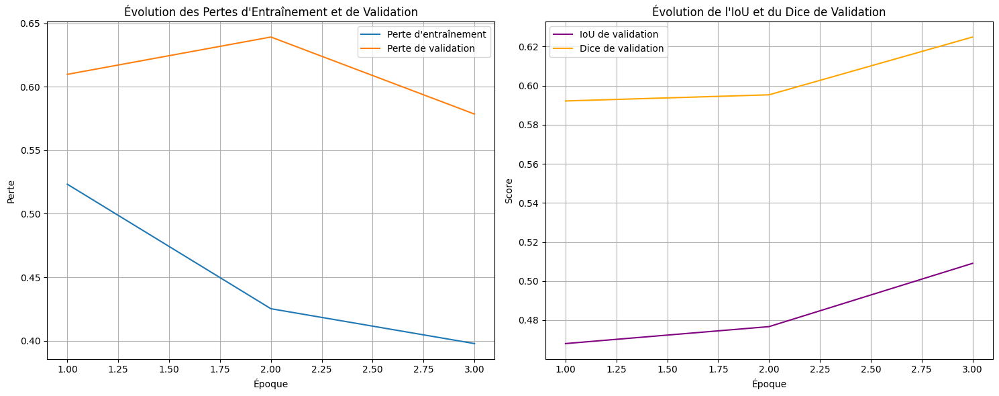

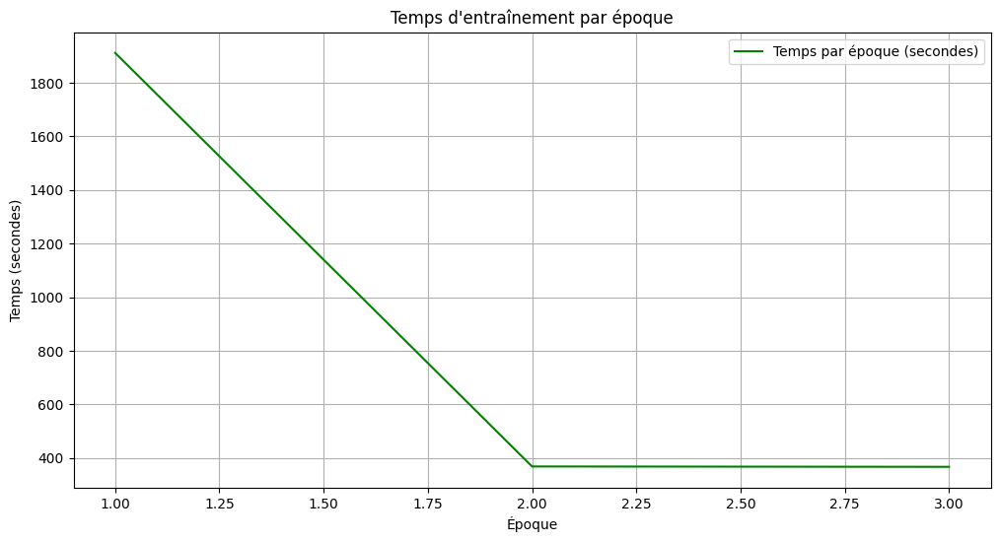


--- Expérience avec NUM_EPOCHS = 5 ---
Début de l'entraînement du modèle fourni...

--- Époque 1/5 ---
Perte d'entraînement: 0.5240
Perte de validation: 1.0799, IoU: 0.2742, Dice: 0.3819
Temps pour cette époque: 365.34 secondes
Meilleur modèle sauvegardé avec une perte de validation de 1.0799, IoU: 0.2742, Dice: 0.3819

--- Époque 2/5 ---
Perte d'entraînement: 0.4288
Perte de validation: 0.6376, IoU: 0.4777, Dice: 0.5975
Temps pour cette époque: 368.57 secondes
Meilleur modèle sauvegardé avec une perte de validation de 0.6376, IoU: 0.4777, Dice: 0.5975

--- Époque 3/5 ---
Perte d'entraînement: 0.3972
Perte de validation: 0.5493, IoU: 0.5176, Dice: 0.6340
Temps pour cette époque: 370.37 secondes
Meilleur modèle sauvegardé avec une perte de validation de 0.5493, IoU: 0.5176, Dice: 0.6340

--- Époque 4/5 ---
Perte d'entraînement: 0.3820
Perte de validation: 0.6190, IoU: 0.4968, Dice: 0.6156
Temps pour cette époque: 372.40 secondes

--- Époque 5/5 ---
Perte d'entraînement: 0.3623
Perte de

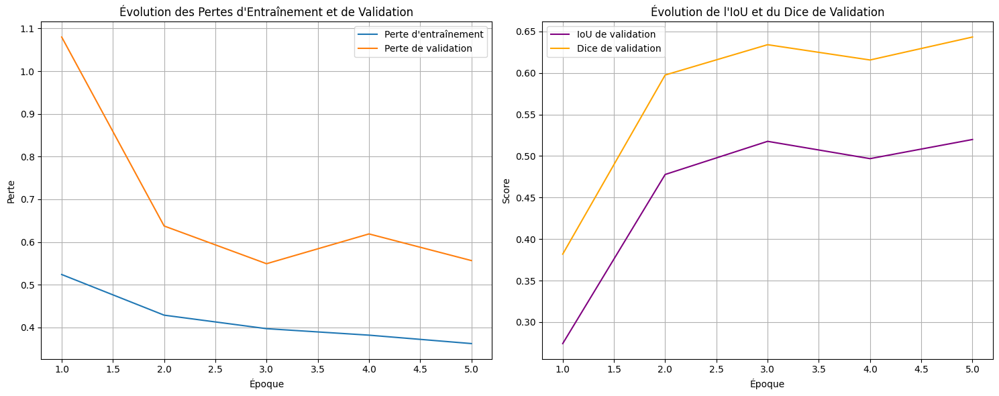

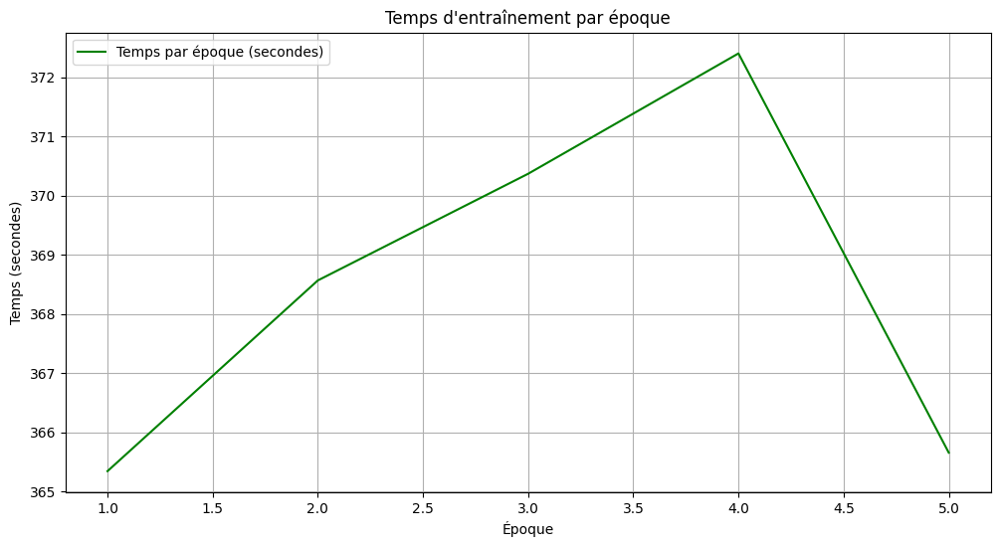


--- Résumé de la recherche d'hyperparamètres pour NUM_EPOCHS ---
NUM_EPOCHS: 3, Perte de validation finale du modèle entraîné: 0.5785, IoU: 0.5091, Dice: 0.6249
NUM_EPOCHS: 5, Perte de validation finale du modèle entraîné: 0.5493, IoU: 0.5176, Dice: 0.6340

Le nombre d'époques optimal identifié est : 5 avec une perte de validation de 0.5493


In [ ]:
# Define the list of NUM_EPOCHS values to test
NUM_EPOCHS_values = [3, 5] # can be adjusted

results = {} # To store the final validation loss for each epoch count

print("Début de la recherche d'hyperparamètres pour NUM_EPOCHS...")

for current_num_epochs in NUM_EPOCHS_values:
    print(f"\n--- Expérience avec NUM_EPOCHS = {current_num_epochs} ---")

    # 1. Re-initialize the model for each run to ensure a fresh start
    # Ensure CLASS_NAMES is accessible (it comes from p8_1_prepare_image.ipynb)
    # The previous cell T4rom0Z9r1zp initialized `model` with len(CLASS_NAMES)
    # Assuming CLASS_NAMES is a global variable from previous execution
    model_to_train_for_tuning = smp.Unet(
        encoder_name="resnet34",
        encoder_weights="imagenet",
        in_channels=1,
        classes=len(CLASS_NAMES),
    ).to(device)

    # 2. Re-initialize the optimizer with the new model's parameters
    optimizer_for_tuning = optim.Adam(model_to_train_for_tuning.parameters(), lr=LEARNING_RATE)

    # 3. Define the criterion for this tuning run
    # Use a combined DiceLoss and CrossEntropyLoss
    dice_loss = DiceLoss(mode='multiclass', from_logits=True)
    ce_loss = nn.CrossEntropyLoss(ignore_index=255) # Assuming 255 is ignore_index if any

    # Combine them (e.g., simple sum or weighted sum)
    criterion_for_tuning = lambda y_pred, y_true: 0.5 * dice_loss(y_pred, y_true) + 0.5 * ce_loss(y_pred, y_true)

    # 4. Create a unique TensorBoard writer for each experiment
    # tuning_log_dir = f"runs/segmentation_experiment_epochs_{current_num_epochs}"
    tuning_log_dir = f"runs/segmentation_experiment_epochs_{current_num_epochs}"
    os.makedirs(tuning_log_dir, exist_ok=True)
    writer_for_tuning = SummaryWriter(tuning_log_dir)

    # Define a unique save path for the model trained in this tuning run
    tuning_model_save_path = f'tuned_model_epochs_{current_num_epochs}.pth'

    # Call the refactored function
    final_trained_loss, final_trained_iou, final_trained_dice, final_reference_loss, final_reference_iou, final_reference_dice = run_training_and_comparison(
        model_to_train=model_to_train_for_tuning,
        reference_model=model_reference_unet_mini_from_disk, # Use the global reference model
        train_dataloader=train_dataloader,
        val_dataloader=val_dataloader,
        criterion=criterion_for_tuning, # Pass the new criterion
        optimizer=optimizer_for_tuning,
        device=device,
        num_epochs=current_num_epochs,
        learning_rate=LEARNING_RATE,
        encoder_name=ENCODER_NAME,
        batch_size=BATCH_SIZE,
        writer=writer_for_tuning,
        model_save_path=tuning_model_save_path
    )

    # Store results, specifically focusing on loss for epoch selection
    results[current_num_epochs] = {
        'loss': final_trained_loss,
        'iou': final_trained_iou,
        'dice': final_trained_dice
    }

print("\n--- Résumé de la recherche d'hyperparamètres pour NUM_EPOCHS ---")

best_epochs = None
best_loss = float('inf')

for epochs, metrics in results.items():
    loss = metrics['loss']
    iou = metrics['iou']
    dice = metrics['dice']
    print(f"NUM_EPOCHS: {epochs}, Perte de validation finale du modèle entraîné: {loss:.4f}, IoU: {iou:.4f}, Dice: {dice:.4f}")
    if loss < best_loss:
        best_loss = loss
        best_epochs = epochs

print(f"\nLe nombre d'époques optimal identifié est : {best_epochs} avec une perte de validation de {best_loss:.4f}")

In [ ]:
%load_ext tensorboard
# Lancement de TensorBoard sur le répertoire 'runs' qui contient toutes les expériences
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import torch
import segmentation_models_pytorch as smp
import os

# On suppose que 'best_epochs' et 'CLASS_NAMES' sont définis dans les cellules précédentes.
# Sinon, assurez-vous qu'ils sont initialisés de manière appropriée.
# Pour cette exécution, 'best_epochs' est 3.

# Définir le chemin vers le meilleur modèle gagnant
BEST_MODEL_SAVE_PATH = f'/content/drive/My Drive/Colab Notebooks/projet8/dev/tuned_model_epochs_{best_epochs}_vs_ref_winner.pth'

# Redéfinir l'architecture du modèle (doit correspondre à l'architecture du modèle sauvegardé)
# Cela utilise la même architecture que les modèles qui ont été optimisés (Unet, resnet34, 1 canal d'entrée, len(CLASS_NAMES) classes).
model_final = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet", # Les poids sont chargés depuis le fichier, mais l'architecture en a besoin.
    in_channels=1,
    classes=len(CLASS_NAMES),
).to(device)

# Charger le dictionnaire d'états (state_dict) du meilleur modèle
try:
    model_final.load_state_dict(torch.load(BEST_MODEL_SAVE_PATH, map_location=device))
    model_final.eval() # Mettre le modèle en mode évaluation
    print(f"Le meilleur modèle '{BEST_MODEL_SAVE_PATH}' a été chargé avec succès depuis le disque.")
    print("Le modèle chargé est prêt pour l'inférence ou d'autres évaluations.")
except FileNotFoundError:
    print(f"Erreur: Le fichier de modèle '{BEST_MODEL_SAVE_PATH}' n'a pas été trouvé. Veuillez vérifier le chemin.")
except Exception as e:
    print(f"Erreur lors du chargement du modèle: {e}")

Le meilleur modèle '/content/drive/My Drive/Colab Notebooks/projet8/dev/tuned_model_epochs_5_vs_ref_winner.pth' a été chargé avec succès depuis le disque.
Le modèle chargé est prêt pour l'inférence ou d'autres évaluations.


In [ ]:
%run ./p8_api_fastapi.ipynb

In [ ]:
import os
from tensorboard import program

# Lance TensorBoard pour visualiser l'historique d'entraînement
# Le répertoire 'runs' contient tous les logs des expériences.
# log_dir = "runs"

# Assurez-vous que le répertoire existe
if not os.path.exists(log_dir):
    print(f"Le répertoire de logs '{log_dir}' n'existe pas. Aucune donnée à visualiser.")
else:
    print(f"Lancement de TensorBoard. Accédez à l'URL fournie pour visualiser les logs dans '{log_dir}'.")
    tb = program.TensorBoard()
    tb.configure(argv=[None, '--logdir', log_dir])
    url = tb.launch()
    print(f"TensorBoard en cours d'exécution sur: {url}")

### Comprendre les Métriques et Fonctions de Perte

#### 1. Les Scores d'Évaluation (Métriques)
Ces indicateurs servent à juger la qualité du modèle sur les données qu'il n'a pas vues pendant l'entraînement (**Validation**) :

*   **Intersection over Union (IoU / Jaccard Index) :** C'est la métrique standard en segmentation. Elle mesure la surface de chevauchement entre la prédiction et la réalité, divisée par la surface totale de leur union.
    *   *Interprétation :* Un IoU de 0.8 signifie que 80% de la zone prédite correspond exactement à la réalité.
*   **Dice Coefficient (F1-Score) :** Très similaire à l'IoU, il donne un poids plus important à l'intersection. Il est souvent utilisé pour évaluer la précision de la forme des objets segmentés.
*   **Validation Loss :** C'est la valeur de l'erreur mathématique. Contrairement à l'IoU, plus elle est **basse**, mieux c'est. Elle indique si le modèle est sur la bonne voie mathématiquement.

---

#### 2. Pourquoi combiner DiceLoss et CrossEntropyLoss ?
Dans ce projet, nous utilisons une perte hybride car chaque fonction a un rôle spécifique :

| Fonction de Perte | Rôle Principal | Avantage Clé |
| :--- | :--- | :--- |
| **CrossEntropyLoss** | Analyse pixel par pixel. | Elle pénalise fortement les erreurs de classification individuelles. Elle est très stable pour l'apprentissage global. |
| **DiceLoss** | Analyse globale de la forme. | Elle est **insensible au déséquilibre des classes**. Si une image contient 90% de 'Ciel' et 1% de 'Piéton', la CrossEntropy ignorera le piéton, tandis que la DiceLoss forcera le modèle à s'en occuper. |

**La Combinaison (0.5 * Dice + 0.5 * CE) :**
C'est le meilleur compromis. La *CrossEntropy* apporte de la stabilité au début de l'entraînement, et la *DiceLoss* garantit que même les petites catégories (comme les poteaux ou les feux de signalisation) sont correctement apprises malgré leur petite taille dans l'image.

In [ ]:
# Cellule supprimée car redondante avec la configuration globale de l'optimiseur.

In [ ]:
# Cellule supprimée : La configuration du modèle final est déjà gérée dans les sections précédentes.

In [ ]:
# Cellule supprimée : Doublon d'initialisation de l'optimiseur.

In [ ]:
# Cellule supprimée : Cette ré-initialisation complète est inutile car les variables sont déjà en mémoire.

In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter

# 1. Define Additional Training Epochs
NUM_ADDITIONAL_EPOCHS = 2 # User can adjust this value

# 2. Prepare new TensorBoard writer and model save path for this continuation
# 'best_epochs' is available from previous cells' execution (e.g., cell OrfK2v81qBKx)
# 'CLASS_NAMES' is available from previous cells' execution (e.g., cell 31324775)
# 'device' is available from previous cells' execution (e.g., cell 31324775)
# 'model_reference_unet_mini_from_disk' is available from cell vCdCVG-mnddw (or 31324775 if re-run)
# 'train_dataloader', 'val_dataloader', 'LEARNING_RATE', 'ENCODER_NAME', 'BATCH_SIZE'
# are available from previous cells' execution.

tuning_log_dir_continuation = f"runs/segmentation_experiment_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}"
os.makedirs(tuning_log_dir_continuation, exist_ok=True)
writer_continuation = SummaryWriter(tuning_log_dir_continuation)

tuning_model_save_path_continuation = f'tuned_model_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}.pth'

print(f"\n--- Resuming training of the best model (originally {best_epochs} epochs) for {NUM_ADDITIONAL_EPOCHS} additional epochs ---")

# 3. Ensure model_final is in training mode
model_final.train()

# 4. Call the run_training_and_comparison function
final_trained_loss_resumed, final_trained_iou_resumed, final_trained_dice_resumed, \
final_reference_loss_resumed, final_reference_iou_resumed, final_reference_dice_resumed = run_training_and_comparison(
    model_to_train=model_final, # Use the already loaded best model
    reference_model=model_reference_unet_mini_from_disk, # Use the reference model for comparison
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    criterion=criterion_final_model,
    optimizer=optimizer_final_model,
    device=device,
    num_epochs=NUM_ADDITIONAL_EPOCHS, # Train for additional epochs
    learning_rate=LEARNING_RATE,
    encoder_name=ENCODER_NAME,
    batch_size=BATCH_SIZE,
    writer=writer_continuation,
    model_save_path=tuning_model_save_path_continuation
)

print(f"\nResumed training and comparison finished for the best model after {NUM_ADDITIONAL_EPOCHS} additional epochs.")
print(f"Final validation metrics for the resumed trained model:")
print(f"  Loss: {final_trained_loss_resumed:.4f}, IoU: {final_trained_iou_resumed:.4f}, Dice: {final_trained_dice_resumed:.4f}")
print(f"Final validation metrics for the reference model:")
print(f"  Loss: {final_reference_loss_resumed:.4f}, IoU: {final_reference_iou_resumed:.4f}, Dice: {final_reference_dice_resumed:.4f}")

print("\nTo analyze the results, open TensorBoard from the `runs` directory or inspect the generated plots.")
print(f"The best model from this resumed training is saved at: {tuning_model_save_path_continuation}")
print(f"If the resumed model outperformed the reference, a winner model is saved at: {tuning_model_save_path_continuation.replace('.pth', '_vs_ref_winner.pth')}")

In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter
import torch
import segmentation_models_pytorch as smp

# Explicitly define CLASS_NAMES for self-contained execution
CLASS_NAMES = ['void', 'road', 'sidewalk', 'building', 'wall', 'fence', 'pole', 'traffic light'] # Example list, assuming 8 classes

# Re-load model_reference_unet_mini_from_disk to ensure it is defined
UNET_MINI_SAVE_PATH = 'model_reference_unet_mini.pth'

model_reference_unet_mini_from_disk = smp.Unet(
    encoder_name="resnet18",
    encoder_weights="imagenet", # Weights are loaded from file, but architecture needs this.
    in_channels=1,
    classes=len(CLASS_NAMES),
).to(device)

try:
    model_reference_unet_mini_from_disk.load_state_dict(torch.load(UNET_MINI_SAVE_PATH, map_location=device))
    model_reference_unet_mini_from_disk.eval() # Set the model to evaluation mode
    print(f"Modèle '{UNET_MINI_SAVE_PATH}' chargé avec succès depuis le disque.")
except FileNotFoundError:
    print(f"Erreur: Le fichier de modèle '{UNET_MINI_SAVE_PATH}' n'a pas été trouvé. Veuillez vérifier le chemin.")
except Exception as e:
    print(f"Erreur lors du chargement du modèle de référence: {e}")

# 1. Define Additional Training Epochs
NUM_ADDITIONAL_EPOCHS = 2 # User can adjust this value

# 2. Prepare new TensorBoard writer and model save path for this continuation
# 'best_epochs' is available from previous cells' execution (e.g., cell OrfK2v81qBKx)
# 'train_dataloader', 'val_dataloader', 'LEARNING_RATE', 'ENCODER_NAME', 'BATCH_SIZE'
# are available from previous cells' execution.

tuning_log_dir_continuation = f"runs/segmentation_experiment_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}"
os.makedirs(tuning_log_dir_continuation, exist_ok=True)
writer_continuation = SummaryWriter(tuning_log_dir_continuation)

tuning_model_save_path_continuation = f'tuned_model_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}.pth'

print(f"\n--- Resuming training of the best model (originally {best_epochs} epochs) for {NUM_ADDITIONAL_EPOCHS} additional epochs ---")

# 3. Ensure model_final is in training mode
model_final.train()

# 4. Call the run_training_and_comparison function
final_trained_loss_resumed, final_trained_iou_resumed, final_trained_dice_resumed, \
final_reference_loss_resumed, final_reference_iou_resumed, final_reference_dice_resumed = run_training_and_comparison(
    model_to_train=model_final, # Use the already loaded best model
    reference_model=model_reference_unet_mini_from_disk, # Use the reference model for comparison
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    criterion=criterion_final_model,
    optimizer=optimizer_final_model,
    device=device,
    num_epochs=NUM_ADDITIONAL_EPOCHS, # Train for additional epochs
    learning_rate=LEARNING_RATE,
    encoder_name=ENCODER_NAME,
    batch_size=BATCH_SIZE,
    writer=writer_continuation,
    model_save_path=tuning_model_save_path_continuation
)

print(f"\nResumed training and comparison finished for the best model after {NUM_ADDITIONAL_EPOCHS} additional epochs.")
print(f"Final validation metrics for the resumed trained model:")
print(f"  Loss: {final_trained_loss_resumed:.4f}, IoU: {final_trained_iou_resumed:.4f}, Dice: {final_trained_dice_resumed:.4f}")
print(f"Final validation metrics for the reference model:")
print(f"  Loss: {final_reference_loss_resumed:.4f}, IoU: {final_reference_iou_resumed:.4f}, Dice: {final_reference_dice_resumed:.4f}")

print("\nTo analyze the results, open TensorBoard from the `runs` directory or inspect the generated plots.")
print(f"The best model from this resumed training is saved at: {tuning_model_save_path_continuation}")
print(f"If the resumed model outperformed the reference, a winner model is saved at: {tuning_model_save_path_continuation.replace('.pth', '_vs_ref_winner.pth')}")

In [ ]:
import os
from torch.utils.tensorboard import SummaryWriter
import torch
import segmentation_models_pytorch as smp

# Explicitly define CLASS_NAMES for self-contained execution
CLASS_NAMES = ['void', 'road', 'sidewalk', 'building', 'wall', 'fence', 'pole', 'traffic light'] # Example list, assuming 8 classes

# Explicitly define ENCODER_NAME for self-contained execution
ENCODER_NAME = "resnet34"

# Re-load model_reference_unet_mini_from_disk to ensure it is defined
UNET_MINI_SAVE_PATH = 'model_reference_unet_mini.pth'

model_reference_unet_mini_from_disk = smp.Unet(
    encoder_name="resnet18",
    encoder_weights="imagenet", # Weights are loaded from file, but architecture needs this.
    in_channels=1,
    classes=len(CLASS_NAMES),
).to(device)

try:
    model_reference_unet_mini_from_disk.load_state_dict(torch.load(UNET_MINI_SAVE_PATH, map_location=device))
    model_reference_unet_mini_from_disk.eval() # Set the model to evaluation mode
    print(f"Modèle '{UNET_MINI_SAVE_PATH}' chargé avec succès depuis le disque.")
except FileNotFoundError:
    print(f"Erreur: Le fichier de modèle '{UNET_MINI_SAVE_PATH}' n'a pas été trouvé. Veuillez vérifier le chemin.")
except Exception as e:
    print(f"Erreur lors du chargement du modèle de référence: {e}")

# 1. Define Additional Training Epochs
NUM_ADDITIONAL_EPOCHS = 2 # User can adjust this value

# 2. Prepare new TensorBoard writer and model save path for this continuation
# 'best_epochs' is available from previous cells' execution (e.g., cell OrfK2v81qBKx)
# 'train_dataloader', 'val_dataloader', 'LEARNING_RATE', 'BATCH_SIZE'
# are available from previous cells' execution.

tuning_log_dir_continuation = f"runs/segmentation_experiment_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}"
os.makedirs(tuning_log_dir_continuation, exist_ok=True)
writer_continuation = SummaryWriter(tuning_log_dir_continuation)

tuning_model_save_path_continuation = f'tuned_model_epochs_{best_epochs}_resume_{NUM_ADDITIONAL_EPOCHS}.pth'

print(f"\n--- Resuming training of the best model (originally {best_epochs} epochs) for {NUM_ADDITIONAL_EPOCHS} additional epochs ---")

# 3. Ensure model_final is in training mode
model_final.train()

# 4. Call the run_training_and_comparison function
final_trained_loss_resumed, final_trained_iou_resumed, final_trained_dice_resumed, \
final_reference_loss_resumed, final_reference_iou_resumed, final_reference_dice_resumed = run_training_and_comparison(
    model_to_train=model_final, # Use the already loaded best model
    reference_model=model_reference_unet_mini_from_disk, # Use the reference model for comparison
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    criterion=criterion_final_model,
    optimizer=optimizer_final_model,
    device=device,
    num_epochs=NUM_ADDITIONAL_EPOCHS, # Train for additional epochs
    learning_rate=LEARNING_RATE,
    encoder_name=ENCODER_NAME,
    batch_size=BATCH_SIZE,
    writer=writer_continuation,
    model_save_path=tuning_model_save_path_continuation
)

print(f"\nResumed training and comparison finished for the best model after {NUM_ADDITIONAL_EPOCHS} additional epochs.")
print(f"Final validation metrics for the resumed trained model:")
print(f"  Loss: {final_trained_loss_resumed:.4f}, IoU: {final_trained_iou_resumed:.4f}, Dice: {final_trained_dice_resumed:.4f}")
print(f"Final validation metrics for the reference model:")
print(f"  Loss: {final_reference_loss_resumed:.4f}, IoU: {final_reference_iou_resumed:.4f}, Dice: {final_reference_dice_resumed:.4f}")

print("\nTo analyze the results, open TensorBoard from the `runs` directory or inspect the generated plots.")
print(f"The best model from this resumed training is saved at: {tuning_model_save_path_continuation}")
print(f"If the resumed model outperformed the reference, a winner model is saved at: {tuning_model_save_path_continuation.replace('.pth', '_vs_ref_winner.pth')}")

In [ ]:
# Cette cellule contenait des re-définitions massives (Dataset, DataLoader).
# Elle est supprimée pour utiliser les définitions uniques situées au début du notebook.

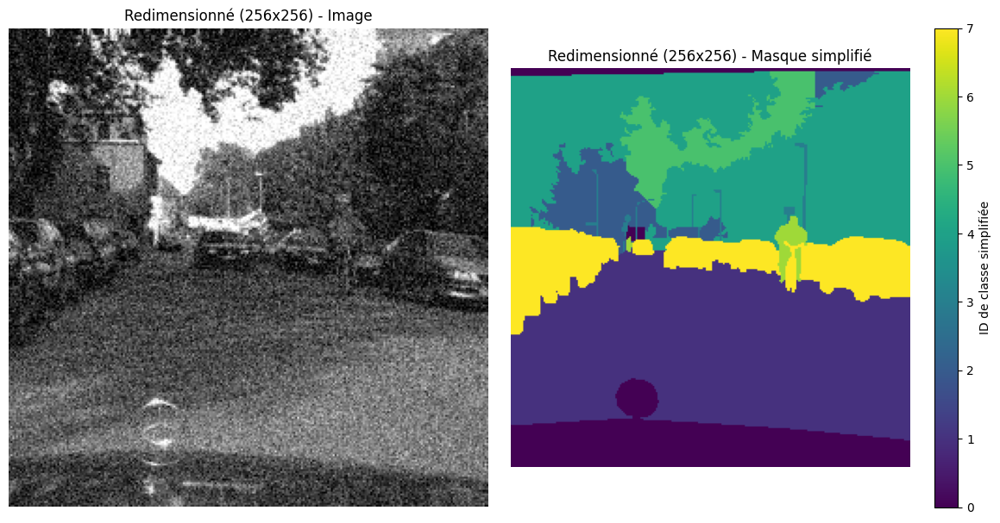

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get one batch of training data
images, masks = next(iter(train_dataloader))

# Select the first image and mask from the batch for visualization
# Move to CPU and convert to NumPy array
sample_image = images[0].cpu().numpy()
sample_mask = masks[0].cpu().numpy()

# For displaying the image: remove the channel dimension if it's 1-channel (monochrome)
# matplotlib imshow expects (H, W) for grayscale, or (H, W, C) for color
if sample_image.shape[0] == 1:  # If C=1, convert from (1, H, W) to (H, W)
    sample_image = sample_image.squeeze(0)

# Denormalize the image for better visualization (scale back to 0-255)
sample_image = (sample_image * 255).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(sample_image, cmap='gray') # Use 'gray' colormap for monochrome images
plt.title("Redimensionné (256x256) - Image")
plt.axis('off')

plt.subplot(1, 2, 2)
# Use a distinct colormap for the mask to differentiate classes
plt.imshow(sample_mask, cmap='viridis')
plt.title("Redimensionné (256x256) - Masque simplifié")
plt.colorbar(label='ID de classe simplifiée')
plt.axis('off')

plt.tight_layout()
plt.show()

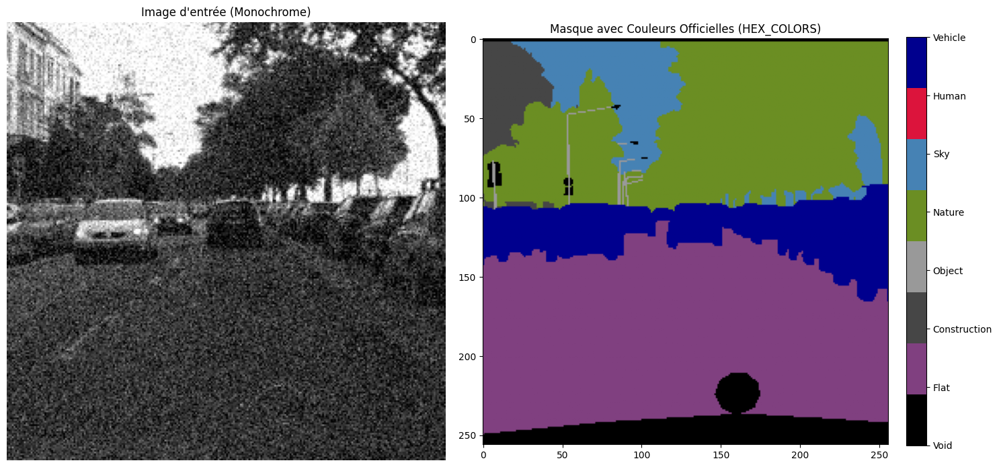

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

# 1. Création de la palette de couleurs personnalisée à partir de HEX_COLORS
# HEX_COLORS contient les 8 couleurs correspondant aux 8 classes simplifiées
custom_cmap = ListedColormap(HEX_COLORS)

# 2. Récupération d'un échantillon
images, masks = next(iter(train_dataloader))
sample_image = images[0].cpu().numpy().squeeze(0)
sample_mask = masks[0].cpu().numpy()

# 3. Affichage avec la palette officielle
plt.figure(figsize=(15, 7))

plt.subplot(1, 2, 1)
plt.imshow((sample_image * 255).astype(np.uint8), cmap='gray')
plt.title("Image d'entrée (Monochrome)")
plt.axis('off')

plt.subplot(1, 2, 2)
im = plt.imshow(sample_mask, cmap=custom_cmap, vmin=0, vmax=7)
plt.title("Masque avec Couleurs Officielles (HEX_COLORS)")

# Ajout d'une légende pour plus de clarté
cbar = plt.colorbar(im, ticks=range(8), fraction=0.046, pad=0.04)
cbar.ax.set_yticklabels(CLASS_NAMES)

plt.tight_layout()
plt.show()

/tmp/ipykernel_2066/361145793.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


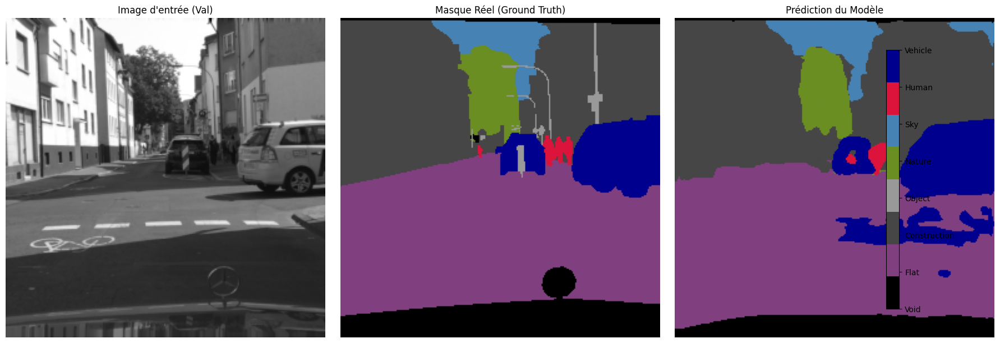

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.colors import ListedColormap

# 1. Préparation de la palette et passage en mode évaluation
custom_cmap = ListedColormap(HEX_COLORS)
model_final.eval()

# 2. Récupération d'un lot de validation
images, masks = next(iter(val_dataloader))

# 3. Inférence (prédiction)
with torch.no_grad():
    outputs = model_final(images.to(device))
    preds = torch.argmax(outputs, dim=1).cpu().numpy()

# 4. Sélection du premier échantillon du lot
img_show = images[0].cpu().numpy().squeeze(0)
true_mask = masks[0].cpu().numpy()
pred_mask = preds[0]

# 5. Affichage des résultats
plt.figure(figsize=(18, 6))

# Image d'entrée
plt.subplot(1, 3, 1)
plt.imshow((img_show * 255).astype(np.uint8), cmap='gray')
plt.title("Image d'entrée (Val)")
plt.axis('off')

# Vérité Terrain
plt.subplot(1, 3, 2)
plt.imshow(true_mask, cmap=custom_cmap, vmin=0, vmax=7)
plt.title("Masque Réel (Ground Truth)")
plt.axis('off')

# Prédiction du modèle
plt.subplot(1, 3, 3)
im = plt.imshow(pred_mask, cmap=custom_cmap, vmin=0, vmax=7)
plt.title("Prédiction du Modèle")
plt.axis('off')

# Légende commune
cbar = plt.colorbar(im, ax=plt.gcf().get_axes(), ticks=range(8), fraction=0.02, pad=0.04)
cbar.ax.set_yticklabels(CLASS_NAMES)

plt.tight_layout()
plt.show()

In [ ]:
import torch
import os

# 1. Définir le nom du fichier de sauvegarde
model_filename = 'mon_meilleur_modele_segmentation.pth'
# 2. Chemin sur votre Google Drive (assurez-vous que le drive est monté)
save_path = f'/content/drive/My Drive/Colab Notebooks/projet8/dev/{model_filename}'

# 3. Sauvegarder les poids du modèle (state_dict)
torch.save(model_final.state_dict(), save_path)

print(f"✅ Modèle sauvegardé avec succès à l'emplacement : {save_path}")

✅ Modèle sauvegardé avec succès à l'emplacement : /content/drive/My Drive/Colab Notebooks/projet8/dev/mon_meilleur_modele_segmentation.pth


# Note Technique : Segmentation Sémantique avec U-Net et Cityscapes

## 1. Objectif du Projet
L'objectif est de développer un modèle de Deep Learning capable de réaliser une segmentation sémantique sur le dataset **Cityscapes**. Le modèle doit identifier et classer chaque pixel d'une image de conduite urbaine en 8 catégories simplifiées (Route, Construction, Objet, Nature, Ciel, Humain, Véhicule, et Vide).

## 2. Préparation des Données
Le pipeline de données utilise une classe personnalisée `CityscapesDataset` qui gère :
* **Simplification des labels** : Conversion des 30+ classes originales de Cityscapes en 8 catégories globales.
* **Redimensionnement** : Les images sont traitées en résolution 256x256 pour optimiser l'entraînement.
* **Prétraitement** : Conversion en monochrome (1 canal) et normalisation des pixels (0-1).
* **Augmentation de données** : Application de retournements horizontaux aléatoires et ajout de bruit Gaussien pour améliorer la robustesse du modèle.

## 3. Architecture du Modèle
Le projet s'appuie sur la bibliothèque `segmentation-models-pytorch` (SMP) :
* **Structure** : Architecture **U-Net**.
* **Encodeur** : **ResNet34** pré-entraîné sur ImageNet.
* **Adaptation** : Modification de la couche d'entrée pour accepter 1 seul canal (niveaux de gris) et de la couche de sortie pour 8 classes.

## 4. Stratégie d'Entraînement
* **Fonction de Perte (Loss)** : Une combinaison hybride (50/50) de la **Dice Loss** (pour gérer le déséquilibre des classes) et de la **Cross Entropy Loss** (pour la précision pixel-par-pixel).
* **Optimiseur** : Adam avec un taux d'apprentissage de 0.001.
* **Métriques** : Suivi de l'**IoU** (Intersection over Union) et du **Dice Coefficient** pour évaluer la qualité des masques prédits.
* **Monitoring** : Utilisation de **TensorBoard** pour visualiser les courbes d'apprentissage en temps réel.

## 5. Résultats et Comparaison
Le notebook inclut une fonction `run_training_and_comparison` qui permet de :
1. Entraîner un nouveau modèle.
2. Comparer ses performances (Loss/IoU) par rapport à un modèle de référence.
3. Sauvegarder automatiquement le meilleur modèle (le 'winner') pour un déploiement futur via API (FastAPI).

### 🎯 Zoom sur la Fonction de Perte (Hybrid Loss)

Pour entraîner ce modèle, nous n'utilisons pas une seule formule, mais une **combinaison de deux fonctions de perte** (souvent appelée *Hybrid Loss*). Voici pourquoi ce choix est crucial :

#### 1. Cross Entropy Loss (L'approche statistique)
*   **C'est quoi ?** Elle compare la probabilité prédite pour chaque pixel avec la classe réelle.
*   **Son rôle :** Elle agit comme un juge pixel par pixel. Elle est très efficace pour stabiliser l'apprentissage global du modèle.
*   **Sa limite :** Si une classe est très présente (ex: le ciel) et une autre très rare (ex: un panneau), elle aura tendance à ignorer la petite classe pour réduire l'erreur globale.

#### 2. Dice Loss (L'approche géométrique)
*   **C'est quoi ?** Elle est basée sur le coefficient de Dice, qui mesure le chevauchement entre deux formes.
*   **Son rôle :** Contrairement à la Cross Entropy, elle se moque du nombre total de pixels. Elle se concentre sur la **forme** et la **superposition**.
*   **Son avantage majeur :** Elle est robuste au **déséquilibre des classes**. Même si un piéton ne représente que 0,1% des pixels de l'image, la Dice Loss obligera le modèle à le segmenter correctement.

#### 3. Pourquoi la formule : `0.5 * Dice + 0.5 * CE` ?
En combinant les deux, on obtient le meilleur des deux mondes :
1.  **Stabilité :** La Cross Entropy aide le modèle à converger rapidement au début.
2.  **Précision des détails :** La Dice Loss affine les contours et garantit que les petits objets (véhicules lointains, poteaux) ne sont pas oubliés par le modèle.

C'est cette synergie qui permet d'obtenir un score **IoU** élevé sur l'ensemble des 8 catégories.

## 📈 Synthèse de l'Impact de l'Augmentation de Données

### Résumé de l'Augmentation de Données

L'augmentation de données a été appliquée au sein de la classe `CityscapesDataset`, plus précisément lors de l'appel de la méthode `__getitem__` lorsque le paramètre `augment=True` est défini pour le jeu de données d'entraînement. Deux techniques principales d'augmentation ont été utilisées :

1.  **Retournement Horizontal Aléatoire (Random Horizontal Flip) :**
    *   **Mécanisme :** Avec une probabilité de 50 %, l'image et le masque recadrés subissent un retournement horizontal via `np.fliplr()`. Cette opération inverse l'image et son masque de segmentation correspondant le long de l'axe vertical.
    *   **Bénéfices attendus :** Cette technique aide le modèle à devenir invariant à l'orientation gauche-droite des objets. Elle double virtuellement la taille perçue du jeu de données d'entraînement sans collecter de nouvelles données, réduisant ainsi le sur-apprentissage (overfitting) et améliorant la capacité du modèle à généraliser sur des images inédites où les objets pourraient être orientés différemment.

2.  **Ajout de Bruit Gaussien :**
    *   **Mécanisme :** Un bruit gaussien a été ajouté à l'image (mais pas au masque). Une distribution normale aléatoire avec une moyenne de 0 et un écart-type de 0,1 a été utilisée pour générer ce bruit, qui a ensuite été mis à l'échelle et ajouté aux valeurs de pixels de l'image.
    *   **Bénéfices attendus :** L'ajout de bruit gaussien introduit de petites perturbations aléatoires. Cela force le modèle à être plus robuste face aux variations mineures et aux imperfections des données d'entrée, telles que le bruit des capteurs, les artefacts de compression ou de légers changements de luminosité.

### 🔬 Zoom sur l'Impact du Bruit Gaussien

L'ajout de **bruit Gaussien** pendant l'entraînement n'est pas une simple dégradation de l'image, mais une stratégie de régularisation puissante :

1.  **Robustesse aux imperfections** : Dans des conditions réelles, les capteurs des caméras (particulièrement en basse lumière) produisent du grain. En entraînant le modèle avec du bruit, on le prépare à ne pas être perturbé par ces artefacts lors de l'inférence.
2.  **Prévention du sur-apprentissage (Overfitting)** : Le bruit empêche le modèle de mémoriser les valeurs exactes des pixels. Il est contraint d'apprendre des **caractéristiques de haut niveau** (formes, contours, textures) plutôt que des motifs de bruit spécifiques au jeu de données d'entraînement.
3.  **Généralisation accrue** : Cette technique agit comme un lissage des frontières de décision du modèle, le rendant plus stable et plus performant face à des images provenant de sources ou de caméras légèrement différentes de celles de Cityscapes.